# Integration of spatial transcriptomics data - Illumina
## Scanpy - BBKNN

___

In [1]:
import os
import sys
import logging
import json
import yaml

from pathlib import Path

from collections import defaultdict

def get_ipython_logger(logging_level='DEBUG', format_str='%(levelname)-8s : %(message)s'):

    level = logging.getLevelName(logging_level)
    formatter = logging.Formatter(format_str)
    
    logger = logging.getLogger()
    logger.setLevel(level)

    # clear whatever handlers were there
    while len(logger.handlers):
        logger.removeHandler(logger.handlers[0])
    
    #h_out = logging.StreamHandler(sys.stdout)
    h_err = logging.StreamHandler(sys.stderr)

    #logger.addHandler(h_out)
    logger.addHandler(h_err)

    for h in logger.handlers:
        h.setFormatter(formatter)

    return logger

logger = get_ipython_logger(logging_level='INFO')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [226]:
import scanpy as sc

import anndata

import numpy as np
import pandas as pd
import scipy as sp
import scipy.io

import bbknn

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white', frameon=False)

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.1


In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

mpl_logger = logging.getLogger('matplotlib')
mpl_logger.setLevel(logging.ERROR) 

from matplotlib import colors

# from Scrublet
def darken_cmap(cmap, scale_factor):
    cdat = np.zeros((cmap.N, 4))
    for ii in range(cdat.shape[0]):
        curcol = cmap(ii)
        cdat[ii,0] = curcol[0] * scale_factor
        cdat[ii,1] = curcol[1] * scale_factor
        cdat[ii,2] = curcol[2] * scale_factor
        cdat[ii,3] = 1
    cmap = cmap.from_list(cmap.N, cdat)
    return cmap
cmaps = darken_cmap(plt.cm.Reds, 0.9)

bone_reversed = plt.cm.get_cmap('bone_r')
copper_reversed = plt.cm.get_cmap('copper_r')
summer_reversed = plt.cm.get_cmap('summer_r')

In [4]:
def p_scatter(adata, x='n_counts', y='n_genes', hue='pct_mt', 
              xl='Count depth (raw)', yl='Number of genes', title='Fraction MT counts',
              mxx=None, mxy=None, show=False):
    ax = sc.pl.scatter(adata,
                       x, 
                       y, 
                       color=hue, 
                       show=show)
    ax.set_title(title)
    ax.set_xlabel(xl)
    ax.set_ylabel(yl)
    if mxx is not None:
        ax.set_xlim(0, mxx)
    if mxy is not None:
        ax.set_ylim(0, mxy)
        
    fig = ax.get_figure()
    return fig

def p_hist(adata, stat='count', x1='n_genes', x2='n_counts', x3='pct_mt', 
           xl1='No. of genes per cell', xl2='Counts per cell', xl3='MT read fraction per cell'):
    
    from matplotlib.offsetbox import AnchoredText
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), sharey=False)
    
    d = sns.histplot(adata.obs[x1], kde=True, ax=ax1, stat=stat)
    ax1.axvline(np.median(adata.obs[x1]), color='k', linestyle='--')
    ax1.set_ylabel('')
    ax1.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {int(np.median(adata.obs[x1]))}\nPeak {int(x[maxid])}\nMode {adata.obs[x1].mode().tolist()[0]}", 
                       loc="upper right", frameon=False, prop=dict(size=10))
    ax1.add_artist(anc)
    
    d = sns.histplot(adata.obs[x2], kde=True, ax=ax2, stat=stat)
    ax2.axvline(np.median(adata.obs[x2]), color='k', linestyle='--')
    ax2.set_ylabel('')
    ax2.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {int(np.median(adata.obs[x2]))}\nPeak {int(x[maxid])}\nMode {adata.obs[x2].mode().tolist()[0]}", 
                       loc="upper right", frameon=False, prop=dict(size=10))
    ax2.add_artist(anc)
    
    d = sns.histplot(adata.obs[x3], kde=True, ax=ax3, stat=stat)
    ax3.axvline(np.median(adata.obs[x3]), color='k', linestyle='--')
    ax3.set_ylabel('')
    ax3.set_yticklabels([])
    
    x = d.lines[0].get_xdata() 
    y = d.lines[0].get_ydata() 
    maxid = np.argmax(y) 
    anc = AnchoredText(f"Median {np.median(adata.obs[x3]):.2}\nPeak {x[maxid]:.2}\nMode {adata.obs[x3].mode().tolist()[0]:.2}", 
                       loc="upper left", frameon=False, prop=dict(size=10))
    ax3.add_artist(anc)
    
    ax1.title.set_text(xl1)
    ax2.title.set_text(xl2)
    ax3.title.set_text(xl3)
    
    return fig


In [6]:
def read_and_qc(sample, library_id, inloc, outloc,
                mt_genes, mt_frac_thr,
                min_counts, max_counts, min_genes, max_genes, min_cells,
                plot=False, no_qc=False):
    
    # load data into AnnData fmt
    # use the built-in read_visium
    # genome=None Filter expression to genes within this genome
    # source_image_path=None Path to the high-resolution tissue image spatial/tissue_hires_image.png
    # load_images=True by default
    adata = sc.read_visium(inloc,
                           count_file='filtered_feature_bc_matrix.h5',
                           library_id=library_id) 
    adata.var_names_make_unique()
    adata.obs['n_counts'] = adata.X.sum(1)
    adata.obs['n_genes'] = (adata.X > 0).sum(1)
    mito_genes = adata.var_names.str.startswith(mt_genes)
    adata.obs['pct_mt'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    
    logger.info(f"{sample}: (Raw) View of AnnData object with n_obs × n_vars {adata.shape}")
    
    if plot:
        fig = p_scatter(adata)
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_pre_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_pre_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")

        fig = p_hist(adata, xl1='No. of genes per spot', xl2='Counts per spot')
        filen = os.path.join(outloc, 'results', 'figures', f"hist_pre_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"hist_pre_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")
        
    if no_qc:
        return adata
        
    # filter
    adata = adata[adata.obs['pct_mt'] < mt_frac_thr]
    sc.pp.filter_cells(adata, min_counts=min_counts)
    sc.pp.filter_cells(adata, max_counts=max_counts)
    sc.pp.filter_cells(adata, min_genes=min_genes)
    sc.pp.filter_cells(adata, max_genes=max_genes)
    sc.pp.filter_genes(adata, min_cells=min_cells)
    
    # update metrics
    adata.obs['n_counts'] = adata.X.sum(1)
    adata.obs['n_genes'] = (adata.X > 0).sum(1)
    mito_genes = adata.var_names.str.startswith(mt_genes)
    adata.obs['pct_mt'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    
    if plot:
        fig = p_scatter(adata)
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_post_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"scatter_post_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")

        fig = p_hist(adata, xl1='No. of genes per spot', xl2='Counts per spot')
        filen = os.path.join(outloc, 'results', 'figures', f"hist_post_{sample}.pdf")
        fig.savefig(filen, bbox_inches = "tight")
        filen = os.path.join(outloc, 'results', 'figures', f"hist_post_{sample}.svg")
        fig.savefig(filen, bbox_inches = "tight")
    
    logger.info(f"{sample}: (Filtered) View of AnnData object with n_obs × n_vars {adata.shape}")
        
    return adata


Quality control
---

Read SpaceRanger `outs` directory for each sample defined in the config file, and apply standard filtering

In [7]:
parent = '/prj/Florian_Leuschner_spatial/analysis/Nanopore/' # change this path!

outloc = '/prj/Florian_Leuschner_spatial/analysis/Illumina' # output directory
outname = 'bbknn' # output generic name

config = yaml.load(open(os.path.join(parent, 'ScNaST', 'workflow', 'config.yaml')), Loader=yaml.FullLoader)
samples = config['samples_cellranger']
ids = {key: key[-1].upper() for key in samples.keys()}
samples = dict((ids[key], value) for (key, value) in samples.items())
samples

{'A': '/prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_A1_149524/outs',
 'B': '/prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_B1_149525/outs',
 'C': '/prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_C1_149526/outs',
 'D': '/prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_D1_149527/outs'}

reading /prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_A1_149524/outs/filtered_feature_bc_matrix.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
INFO     : VX06_A1_149524: (Raw) View of AnnData object with n_obs × n_vars (1993, 32285)
... storing 'feature_types' as categorical
... storing 'genome' as categorical
filtered out 20 cells that have less than 250 counts
Trying to set attribute `.obs` of view, copying.
filtered out 14 cells that have more than 6500 counts
filtered out 11 cells that have less than 250 genes expressed
filtered out 8 cells that have more than 2500 genes expressed
filtered out 17794 genes that are detected in less than 2 cells
INFO     : VX06_A1_149524: (Filtered) View of AnnData object with n_obs × n_vars (1933, 14491)
reading /prj/Florian_Leuschner_spatial/Illumina/VX06_A006200151/cellranger/VX06_B1_149525/

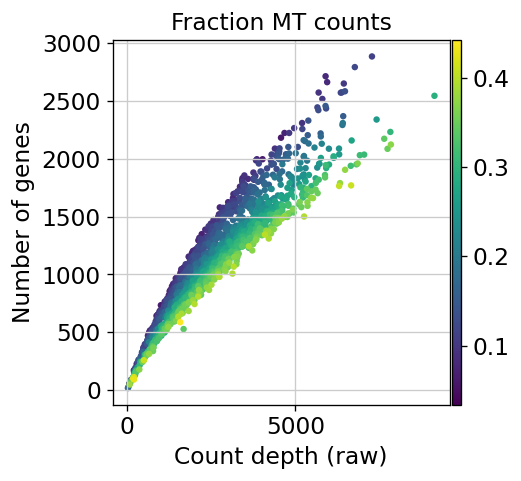

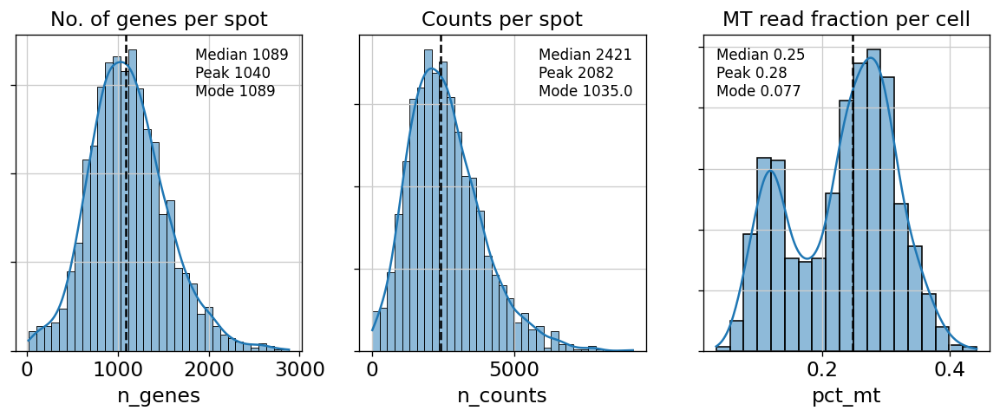

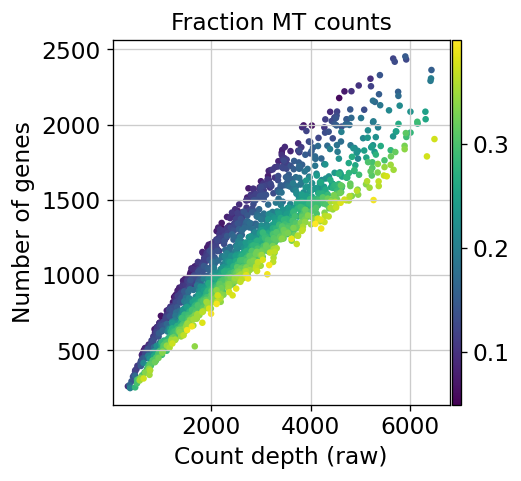

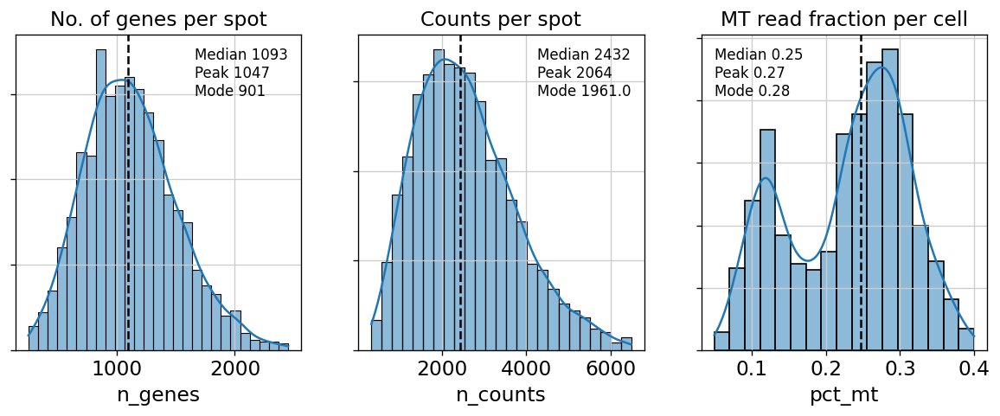

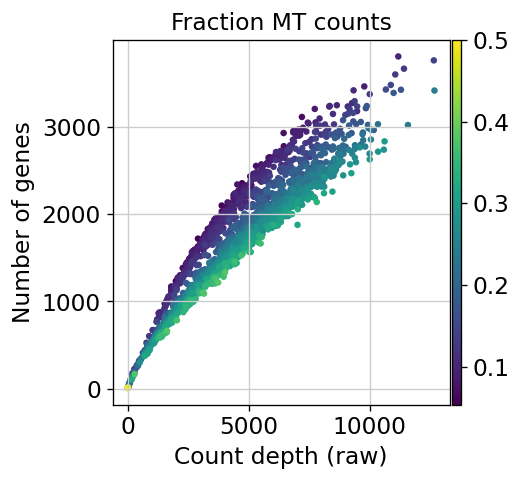

...

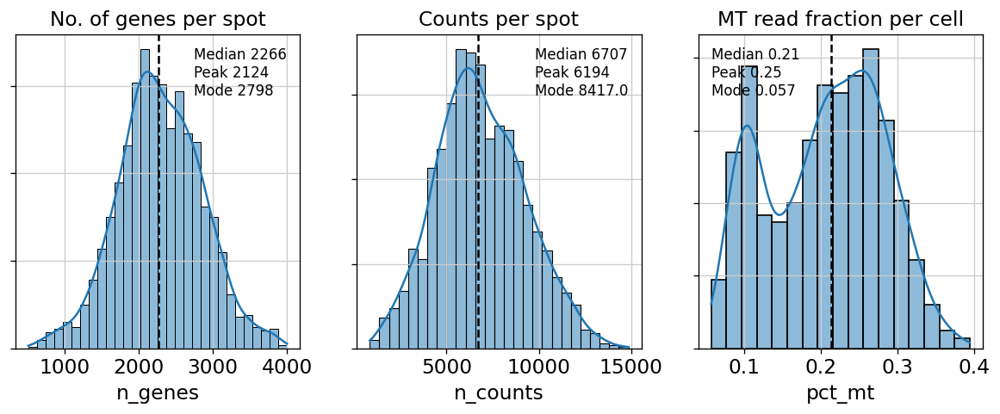

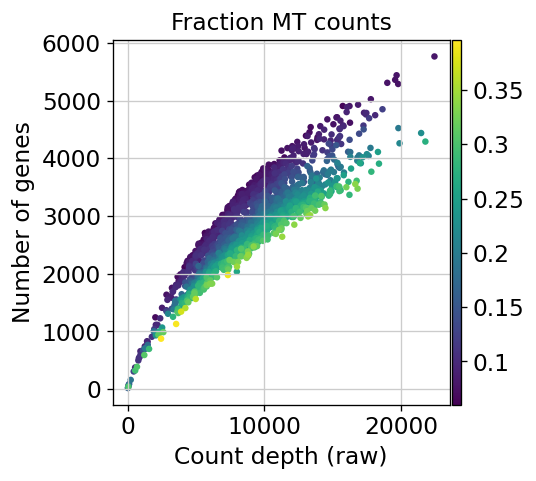

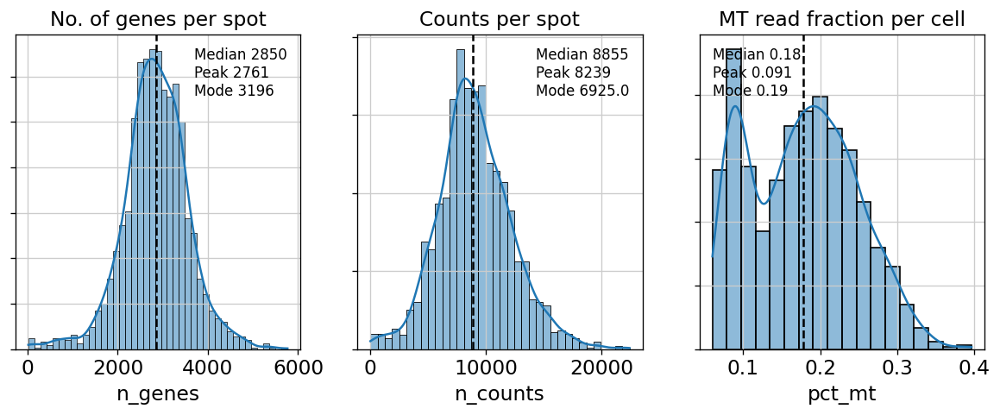

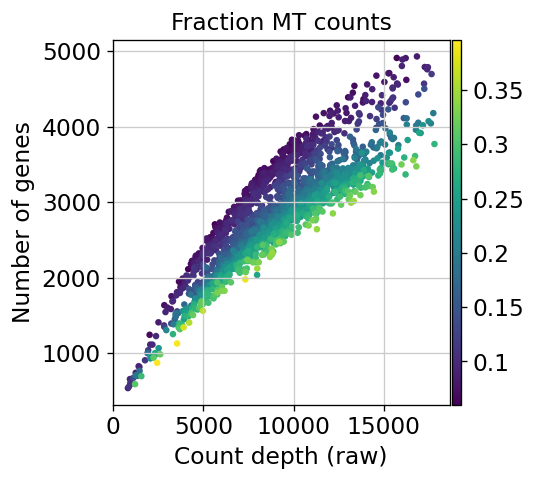

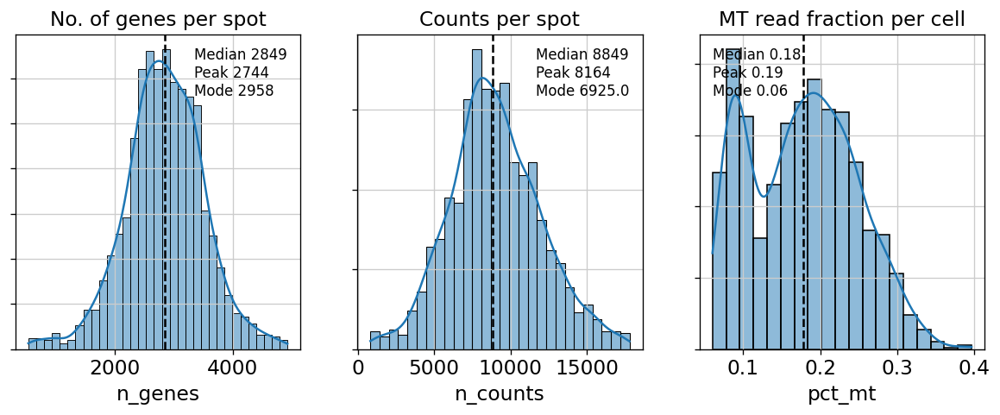

In [9]:
# Filtering
# For heart samples, a MT fraction cutoff of 20-30% is often used, or even higher, consistently with observations made earlier 
# that in tissues with high energy demand the MT fraction can reach up to 30% or more.
# Unless we find strong indications that the cells are stressed, apoptotic, or dying, we can assume that the high MT fraction is related to
# a biologically relevant mitochondrial activity. See also 10.1093/bioinformatics/btaa751
mt_frac_thr = 0.4
# These are defined per sample, since we have varying library depth for each slice/sample.
min_counts = {'VX06_A1_149524': 250, 
              'VX06_B1_149525': 250, 
              'VX06_C1_149526': 500, 
              'VX06_D1_149527': 500}
max_counts = {'VX06_A1_149524': 6500, 
              'VX06_B1_149525': 11000, 
              'VX06_C1_149526': 15000, 
              'VX06_D1_149527': 18000}
min_genes = {'VX06_A1_149524': 250, 
             'VX06_B1_149525': 250, 
             'VX06_C1_149526': 500, 
             'VX06_D1_149527': 500}
max_genes = {'VX06_A1_149524': 2500, 
             'VX06_B1_149525': 3500, 
             'VX06_C1_149526': 4000, 
             'VX06_D1_149527': 5000}
min_cells = 3

# Read the data into AnnData objects
# We use filtered visium dataset, i.e. the output of SpaceRanger that contains only spots within the tissue slices
slides = []
for s, p in samples.items():
    sample = os.path.basename(str(Path(p).parents[0]))
    slide = read_and_qc(sample=sample, 
                        library_id=s, 
                        inloc=p, 
                        outloc=outloc,
                        mt_genes='mt-', 
                        mt_frac_thr=mt_frac_thr,
                        min_counts=min_counts[sample], 
                        max_counts=max_counts[sample], 
                        min_genes=min_genes[sample], 
                        max_genes=max_genes[sample], 
                        min_cells=2,
                        plot=True, 
                        no_qc=False)
    slides.append(slide)
    

Concatenate and normalize
---

Find HVG on the concatenated object.


In [10]:
# first concatenate - 
# combine AnnData objects together
adata = slides[0].concatenate(
    slides[1:],
    join='inner', 
    batch_key="library_id",
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            slides[0].uns["spatial"],
            slides[1].uns["spatial"],
            slides[2].uns["spatial"],
            slides[3].uns["spatial"],
        ]
        for k, v in d.items()
    ],
)
adata

# write counts (full dimension) to disk before normalization/HVG
filen = os.path.join(outloc, "data", f"concatenated_raw_{outname}.h5ad")
adata.write_h5ad(filen)

logger.info(f"Written raw counts to {filen}")

# save as layer
adata.layers["counts"] = adata.X.copy()

AnnData object with n_obs × n_vars = 7708 × 14023
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_genes', 'pct_mt', 'library_id'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells-A', 'n_cells-B', 'n_cells-C', 'n_cells-D'
    uns: 'spatial'
    obsm: 'spatial'

INFO     : Written raw counts to /prj/Florian_Leuschner_spatial/analysis/Illumina/data/concatenated_raw_bbknn.h5ad


In [11]:
# Normalization standard workflow
# We proceed to normalize Visium counts data with the built-in normalize_total method from Scanpy, and detect highly-variable genes. 
# Although the variance in molecular counts across spots is not just technical in nature, but also could depend on the tissue anatomy,
# other methods e.g. SCTransform do not seem a priori to outperform standard normalization + integration/batch correction e.g. using BBKNN
target_sum = 1e4
sc.pp.normalize_total(adata, 
                      target_sum=target_sum, 
                      exclude_highly_expressed=True)
sc.pp.log1p(adata)

# keep full dimension safe
adata.raw = adata
# the idea is to avoid including batch specific genes in the analysis...
sc.pp.highly_variable_genes(adata, batch_key="library_id")

logger.info(f"View of AnnData object with n_obs × n_vars {adata.shape}")

# keep the union
nbatches = 0 # or e.g. genes that are variable in at least 2 datasets nbatches = 2
adata = adata[:,adata.var.highly_variable_nbatches > nbatches]

logger.info(f"View of AnnData object with n_obs × n_vars {adata.shape}")


normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['mt-Co1', 'mt-Co2', 'mt-Atp6', 'mt-Co3']
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
INFO     : View of AnnData object with n_obs × n_vars (7708, 14023)
INFO     : View of AnnData object with n_obs × n_vars (7708, 8160)


BBKNN 
---

With ridge regression.


In [14]:
sc.tl.pca(adata, 
          svd_solver='arpack', 
          use_highly_variable=True)

# sc.pl.pca_variance_ratio(adata)

n_pcs = 10

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [15]:
# after bnknn  `.X` now features regression residuals
# `.layers['X_explained']` stores the expression explained by the technical effect

bbknn.bbknn(adata, batch_key='library_id', neighbors_within_batch=15, n_pcs=n_pcs, trim=20)

resolution = 0.4
key_added = 'leiden_rr'

sc.tl.leiden(adata, 
             resolution=resolution, 
             key_added=key_added)
bbknn.ridge_regression(adata, batch_key=['library_id'], confounder_key=['leiden_rr'])
sc.tl.pca(adata, 
          svd_solver='arpack', 
          use_highly_variable=True) # reuse same number of components here
bbknn.bbknn(adata, batch_key='library_id', neighbors_within_batch=15, n_pcs=n_pcs, trim=20)


computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_rr', the cluster labels (adata.obs, categorical) (0:00:00)
computing ridge regression
	finished: `.X` now features regression residuals
	`.layers['X_explained']` stores the expression explained by the technical effect (0:00:01)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


Dimensionality reduction and clustering 
---

Define regions to recover infarct, border and remote zones. 

In [27]:
# BBKNN replaces neighbours
sc.tl.umap(adata, min_dist=0.1, spread=.6)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


In [33]:
resolution = 0.3
sc.tl.leiden(adata, 
             resolution=resolution, 
             key_added="region") 
adata.obs['region'].value_counts()

running Leiden clustering
    finished: found 4 clusters and added
    'region', the cluster labels (adata.obs, categorical) (0:00:00)


0    3063
1    2164
2    1655
3     826
Name: region, dtype: int64

In [35]:
# set colors for plotting

adata.uns['region_colors'] = ["#3498db", "#95a5a6", "#e74c3c", "#2ecc71"]

clusters_colors = dict(
    zip([str(i) for i in range(18)], adata.uns["region_colors"])
)

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

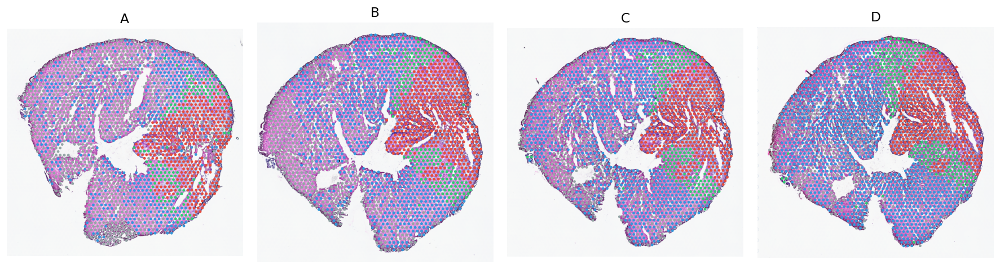

In [36]:
fig, axs = plt.subplots(1, 4, figsize=(15, 10))

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="region",
        title=library,
        #size=1.5,
        palette=[
            v
            for k, v in clusters_colors.items()
            if k in ad.obs.region.unique().tolist()
        ],
        legend_loc=None,
        show=False,
        ax=axs[i],
    )

plt.tight_layout()

In [37]:
for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"spatial_clusters_{outname}.{ext}")
    fig.savefig(filen, bbox_inches = "tight")

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'A'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'B'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'C'}, xlabel='spatial1', ylabel='spatial2'>]

[<AxesSubplot:title={'center':'D'}, xlabel='spatial1', ylabel='spatial2'>]

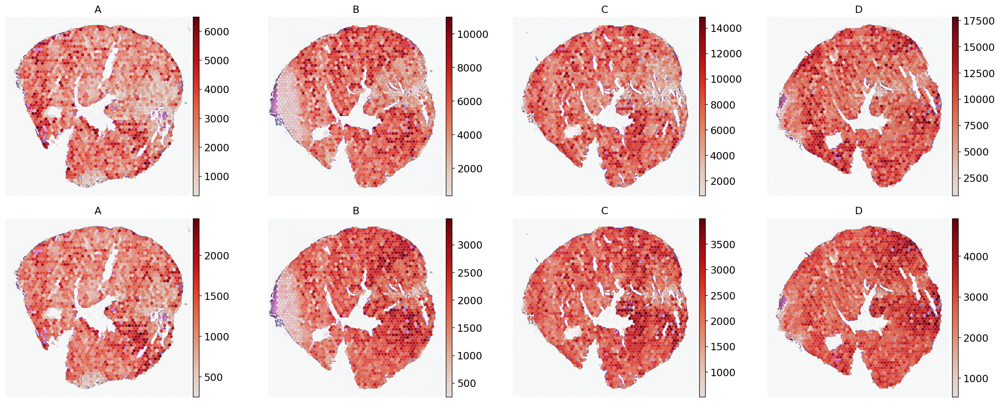

In [38]:
fig, axs = plt.subplots(2, 4, figsize=(20, 8))

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="n_counts",
        size=1.5,
        title=library,
       # vmin=1000,
       # vmax=15000,
        color_map=cmaps,
        legend_loc=None,
        show=False,
        ax=axs[0,i],
    )

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = adata[adata.obs.library_id == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="n_genes",
        size=1.5,
        title=library,
       # vmin=500,
       # vmax=4500,
        color_map=cmaps,
        legend_loc=None,
        show=False,
        ax=axs[1,i],
    )
    
plt.tight_layout()

In [40]:
for ext in ['pdf', 'svg']:
    filen = os.path.join(outloc, 'results', 'figures', f"spatial_counts_{outname}.{ext}")
    fig.savefig(filen, bbox_inches = "tight")

Marker genes and annotation of anatomical regions
---

Find expression of marker genes in coarse anatomical regions.

In [67]:
markers = {'CM': ['Tnnt2',
  'Myl2',
  'Myl3',
  'Myh6',
  'Myh7',
  'Ttn',
  'Actc1',
  'Actn2',
  'Fabp3',
  'Nppa',
  'Ankrd1'],
  'EC': ['Postn', 'Tmsb10', 'Cdh5', 'Pecam1'],
 'MFB': ['Col1a2',
  'Acta2',
  'Igfbp7',
  'Vim',
  'Serpinh1',
  'Fbln2',
  'Sparc',
  'Fn1',
  'Tcf21'],
 'Fibrosis': ['Mmp2', 'Ccn2', 'Agt'],
 'IM': ['Lyz2', 'C1qa', 'C1qb', 'Cd47', 'Cd74', 'Cd36', 'B2m', 'C3'],
 'Inflammation': ['Hck', 'Cd53', 'Tyrobp', 'Clu']}


In [139]:
key_added = 'region'
sc.tl.rank_genes_groups(adata, 
                        groupby=key_added, 
                        key_added=f'ranked_{key_added}', 
                        method='wilcoxon', 
                        tie_correct=True,
                        use_raw=True)


<AxesSubplot:>

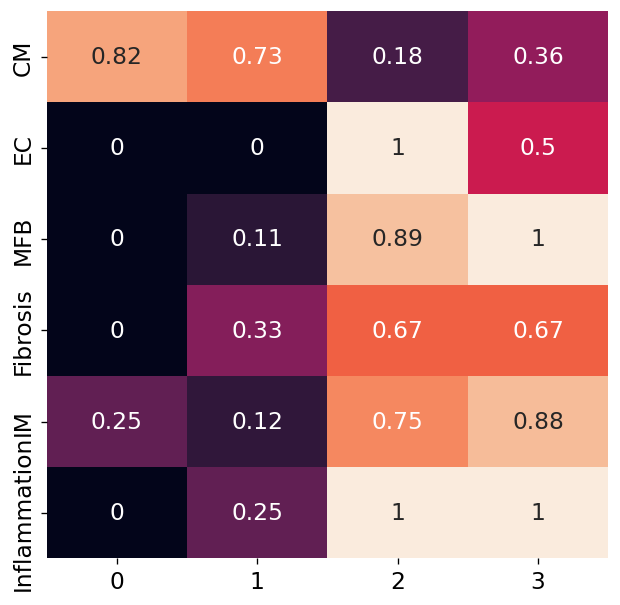

In [68]:
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, markers, key='ranked_region', 
                                                 normalize='reference', adj_pval_threshold=1e-5)
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(cell_annotation_norm, cbar=False, annot=True, ax=ax)

In [52]:
# rename regions
adata.obs['anatomical_region'] = adata.obs['region'].values.copy()

new_cats = {0 : 'Remote zone 1',
            1 : 'Remote zone 2',
            2 : 'Infarct',
            3 : 'Border zone'}

adata.rename_categories('anatomical_region', list(new_cats.values()))

In [54]:
sc.tl.dendrogram(adata, 'anatomical_region', use_rep='X_pca')

Storing dendrogram info using `.uns['dendrogram_anatomical_region']`


categories: Remote zone 1, Remote zone 2, Infarct, etc.
var_group_labels: CM, EC, MFB, etc.


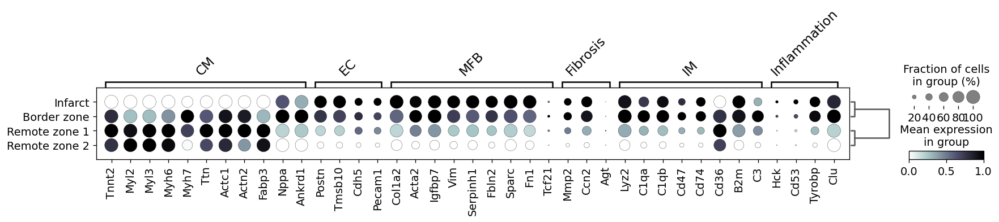

In [70]:
sc.pl.dotplot(
    adata,
    markers,
    groupby='anatomical_region',
    dendrogram=True,
    color_map=bone_reversed,
    swap_axes=False,
    use_raw=True, 
    standard_scale="var",
    var_group_rotation=45,
    save=f'_selected_markers_{outname}.pdf'
)

ranking genes
    finished: added to `.uns['ranked_anatomical_region']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:37)


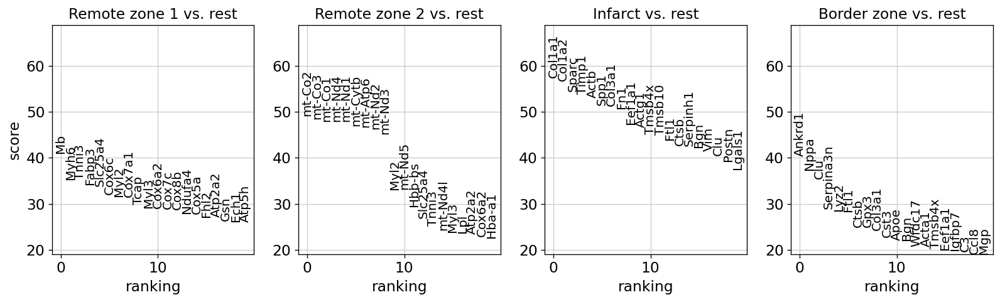

In [81]:
# rewrite markers
key_added = 'anatomical_region'
sc.tl.rank_genes_groups(adata, 
                        groupby=key_added, 
                        key_added=f'ranked_{key_added}', 
                        method='wilcoxon', 
                        tie_correct=True,
                        use_raw=True)

sc.pl.rank_genes_groups(adata, 
                        key=f'ranked_{key_added}', 
                        fontsize=12,
                        save=f'_{outname}.png')

In [82]:
dfl = []
for group in adata.uns[f'ranked_{key_added}']['names'].dtype.names:
    cols = {'names':adata.uns[f'ranked_{key_added}']['names'][group], 
            'scores':adata.uns[f'ranked_{key_added}']['scores'][group], 
            'pvals':adata.uns[f'ranked_{key_added}']['pvals'][group], 
            'pvals_adj':adata.uns[f'ranked_{key_added}']['pvals_adj'][group],
            'logfoldchanges':adata.uns[f'ranked_{key_added}']['logfoldchanges'][group],
            'anatomical_region': group}
    dfl.append(pd.DataFrame(cols))
wilcox_region_long = pd.concat(dfl)
filen = os.path.join(outloc, "results", "tables", f"wilcox_region_long_{outname}.csv.gz")
wilcox_region_long.to_csv(filen, compression='gzip', index=False)

Filtering genes using: min_in_group_fraction: 0.2 min_fold_change: 0.2, max_out_group_fraction: 0.5


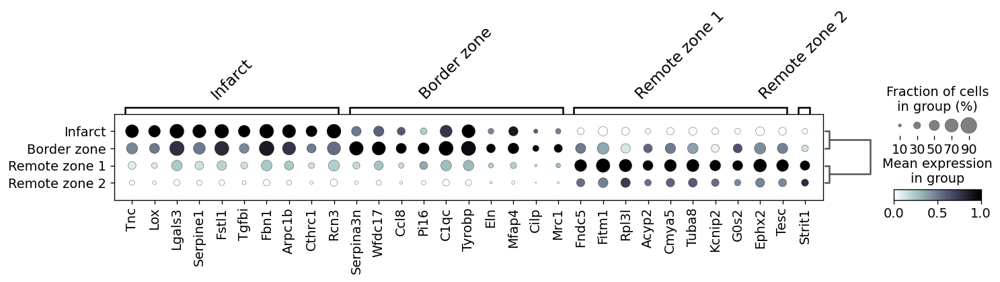

In [87]:
# filtering of marker genes
sc.tl.filter_rank_genes_groups(adata,
                               key=f'ranked_{key_added}',
                               min_in_group_fraction=0.2,
                               min_fold_change=.2)
sc.pl.rank_genes_groups_dotplot(adata, 
                                key='rank_genes_groups_filtered', 
                                dendrogram=True,
                                color_map=bone_reversed,
                                standard_scale="var",
                                var_group_rotation=45,
                                save=f'_ranked_markers_{outname}.pdf')


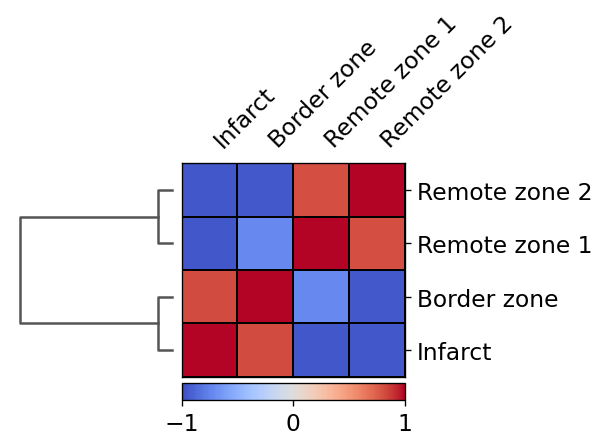

In [270]:
# we can check correlation between assigned clusters directly using
sc.pl.correlation_matrix(adata, 'anatomical_region', cmap='coolwarm', save=f'_corr_regions_{outname}.pdf')

ORA - anatomical regions
---

In [95]:
# enrichr default background
import gseapy


# ranked gene groups - wilcoxon default
pval_cutoff = 0.05
log2fc_min = 0.2

gene_sets = 'GO_Biological_Process_2021'
title = "GO BP"

for idx, reg in enumerate(adata.obs.anatomical_region.cat.categories):
    glist = sc.get.rank_genes_groups_df(adata, group=reg, key='ranked_anatomical_region',
                                        pval_cutoff=pval_cutoff, log2fc_min=log2fc_min)['names'].squeeze().str.strip().tolist()
    enr_res = gseapy.enrichr(gene_list=glist,
                             organism='Mouse',
                             gene_sets=gene_sets,
                             description='pathway',
                             cutoff=0.01)
    
    for ext in ['pdf', 'svg']:
        filen = os.path.join(outloc, "results", "figures", f"clust{idx}_{gene_sets}_{outname}.{ext}")
        gseapy.barplot(enr_res.res2d, title=f"{title}, {reg}", color=adata.uns['region_colors'][idx], ofname=filen)
    

Figures and save data
---

In [160]:
# UMAP anatomical regions
adata.uns['anatomical_region_colors'] = ["#3498db", "#95a5a6", "#e74c3c", "#2ecc71"]
# sc.pl.umap(adata, color=["anatomical_region", "library_id"], title=['Anatomical region', 'Slice'], ncols=1, save=f'_combined_{outname}.pdf')
# sc.pl.umap(adata, color=["anatomical_region", "library_id"], title=['Anatomical region', 'Slice'], ncols=1, save=f'_combined_{outname}.svg')

In [ ]:
# clean and write to disk
del adata.obs['leiden_rr']
del adata.obs['region']

del adata.uns['region_colors']
del adata.uns['ranked_region']
del adata.uns['rank_genes_groups_filtered']

del adata.var['means']
del adata.var['dispersions']
del adata.var['dispersions_norm']

In [171]:
adata

AnnData object with n_obs × n_vars = 7708 × 8160
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_genes', 'pct_mt', 'library_id', 'anatomical_region'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells-A', 'n_cells-B', 'n_cells-C', 'n_cells-D', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'spatial', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'library_id_colors', 'dendrogram_anatomical_region', 'ranked_anatomical_region', 'anatomical_region_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'X_explained'
    obsp: 'distances', 'connectivities'

In [174]:
filen = os.path.join(outloc, "data", f"anatomical_regions_{outname}.h5ad")
adata.write_h5ad(filen)


Label transfer from scRNA-seq dataset
---

Run stereoscope (deconvolution) on GPUs and load data for analysis.


In [271]:
stereo = sc.read_h5ad(os.path.join(outloc, "scvi", "stereoscope", "bbknn_stereoscope.h5ad"))
stereo

AnnData object with n_obs × n_vars = 7708 × 1524
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_genes', 'pct_mt', 'library_id', 'anatomical_region', '_indices', 'cardiac muscle cell', 'cardiac neuron', 'endocardial cell', 'endothelial cell', 'erythrocyte', 'fibroblast', 'leukocyte', 'myofibroblast cell', 'professional antigen presenting cell', 'smooth muscle cell'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells-A', 'n_cells-B', 'n_cells-C', 'n_cells-D', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'anatomical_region_colors', 'dendrogram_anatomical_region', 'hvg', 'leiden', 'library_id_colors', 'neighbors', 'pca', 'ranked_anatomical_region', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution', 'spatial'
    varm: 'PCs'
    layers: 'X_explained', 'counts'
    obsp: 'connectivities', 'distances'

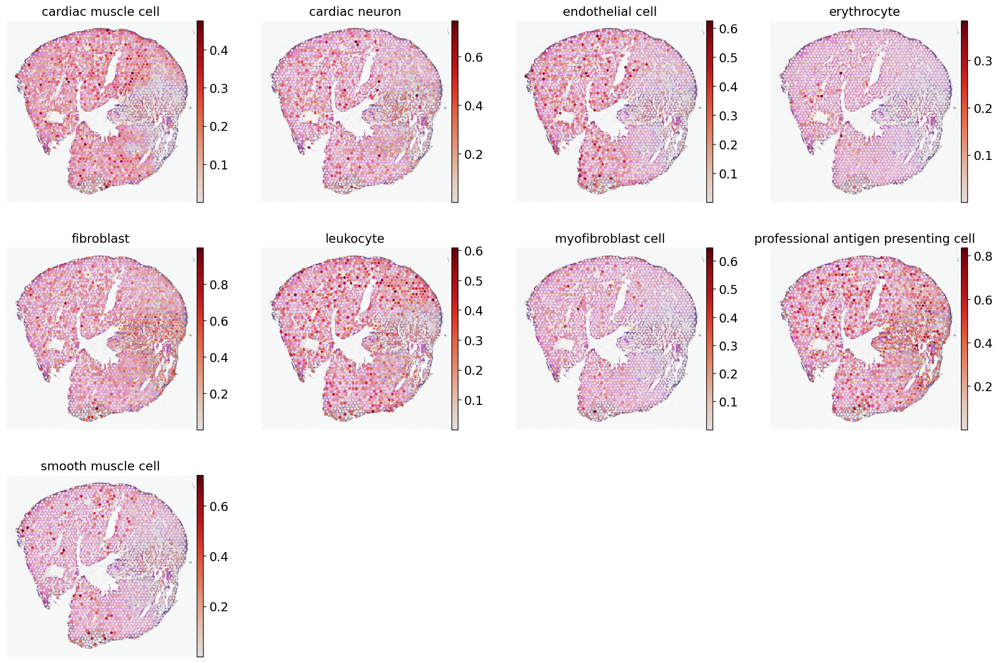

<Figure size 480x480 with 0 Axes>

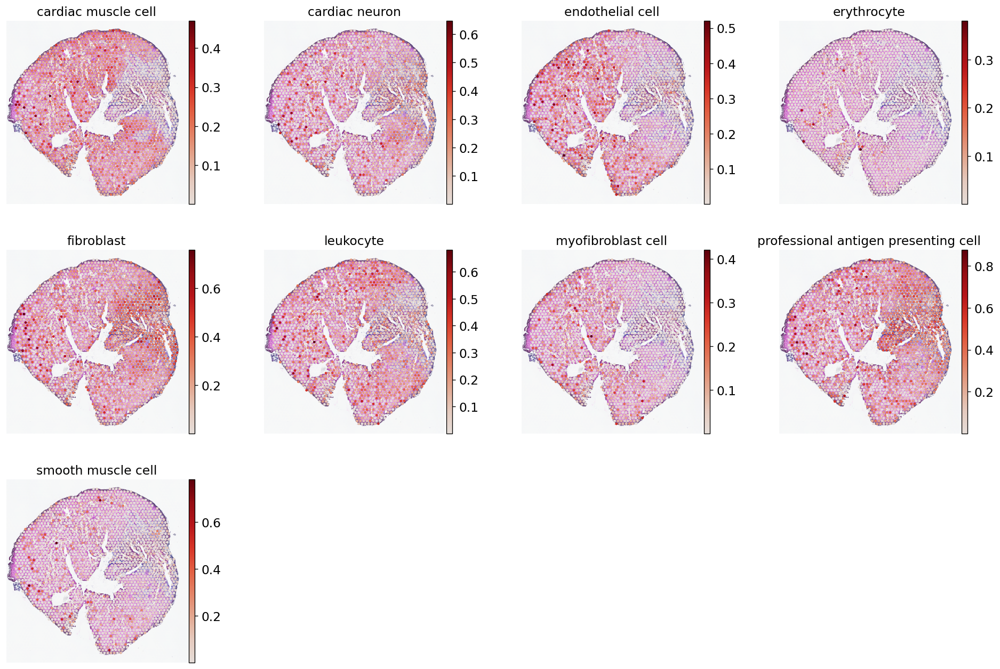

<Figure size 480x480 with 0 Axes>

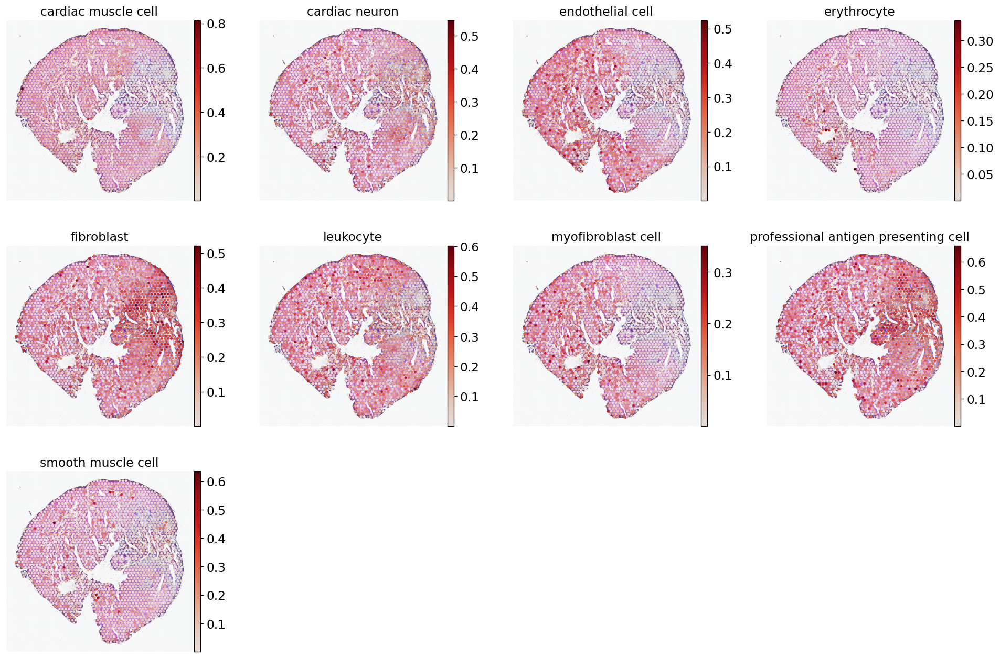

<Figure size 480x480 with 0 Axes>

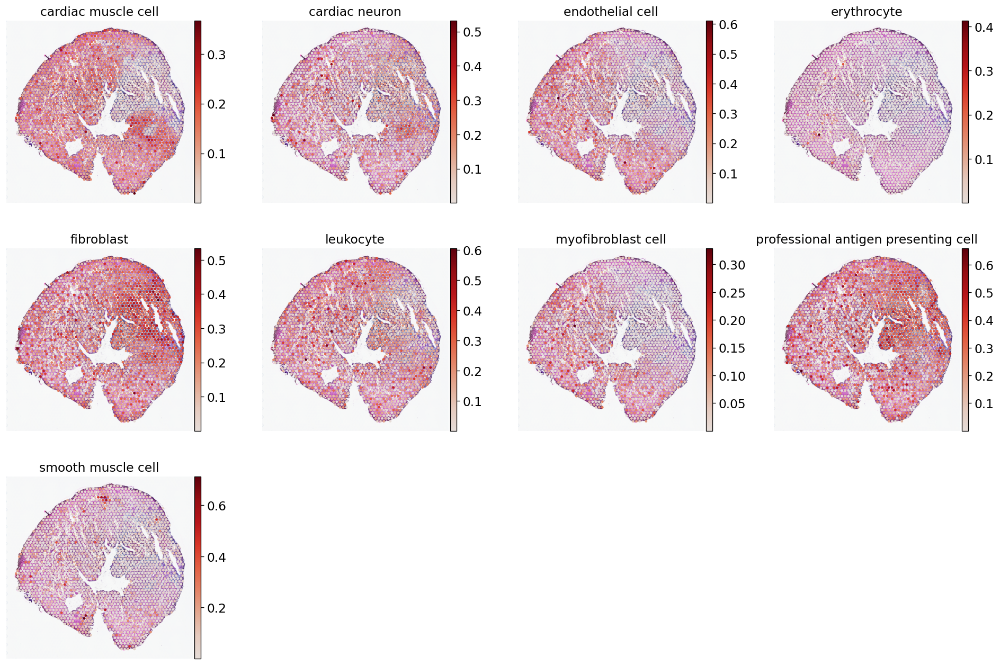

<Figure size 480x480 with 0 Axes>

In [274]:
# inferred cell proportion from Tabula Muris

cell_types = ['cardiac muscle cell', 'cardiac neuron', 'endothelial cell', 
              'erythrocyte', 'fibroblast', 'leukocyte', 'myofibroblast cell',
              'professional antigen presenting cell', 'smooth muscle cell']

for i, library in enumerate(
    ['A', 'B', 'C', 'D']
):
    ad = stereo[stereo.obs.library_id == library, :].copy()
    sc.pl.spatial(ad, 
                  img_key = "hires", 
                  library_id = library,
                  color = cell_types, 
                  size = 1.2, 
                  color_map = cmaps)
    plt.tight_layout()
    for ext in ['pdf', 'svg']:
        filen = os.path.join(outloc, 'results', 'figures', f"stereoscope_{library}_{outname}.{ext}")
        fig.savefig(filen, bbox_inches = "tight")


In [287]:
# add deconvolution to existing AnnData (obsm)

adata.obsm['deconvolution'] = stereo.obsm['deconvolution']

filen = os.path.join(outloc, "data", f"anatomical_regions_and_cell_props_{outname}.h5ad")
adata.write_h5ad(filen)